In [1]:
import datetime
import sys, os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
import scanpy as sc
sc.logging.print_memory_usage()
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi = 300, dpi_save = 300)
sc.logging.print_header()

from matplotlib.pyplot import rc_context

Memory usage: current 0.20 GB, difference +0.20 GB
scanpy==1.10.1 anndata==0.10.7 umap==0.5.5 numpy==1.26.4 scipy==1.13.0 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


In [3]:
# add the utility functions folder to PATH
sys.path.append(os.path.abspath("../packages"))
from db_dev.helper import *

In [4]:
home_dir = os.path.expanduser("~")
current_directory = os.getcwd()

#adata = sc.read_h5ad(home_dir+"/NAS/data/240523_VH00558_558_AACJ2FKHV_trimmed_tso_PE/adatas/norm_filtered_log_hvg_z_pca_harmony_after_filtering_and_doublet_64656x2500_240531_16h50.h5ad")
adata = sc.read_h5ad(current_directory+"/backups/bb2_bb3_norm_filtered_log_hvg_z_pca_harmony_after_filtering_and_doublet_and_extra_filtering_raw_round2_86447x37733_241008_23h02.h5ad")

# Initial clustering

running Leiden clustering
    finished (0:00:03)


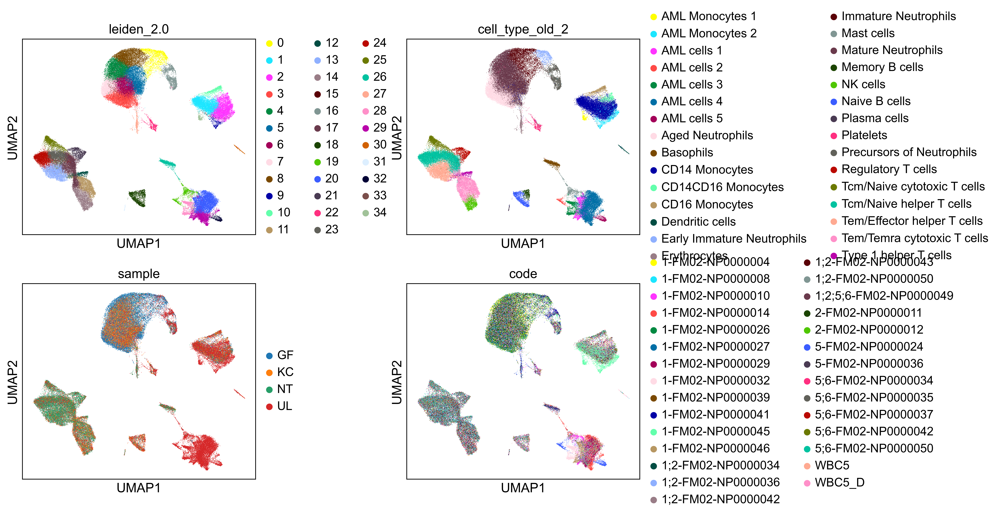

In [5]:
sc.tl.leiden(adata, flavor = "igraph", resolution = 2.0, key_added = "leiden_2.0")
sc.pl.umap(adata, color = ["leiden_2.0", "cell_type_old_2", "sample", "code"], 
           alpha = 1, 
           wspace = 0.5,
           ncols = 2,
           s = 1,
           save = "_leiden_2.0_clean_v2.png")

#n_iterations = 2

running Leiden clustering
    finished (0:00:04)


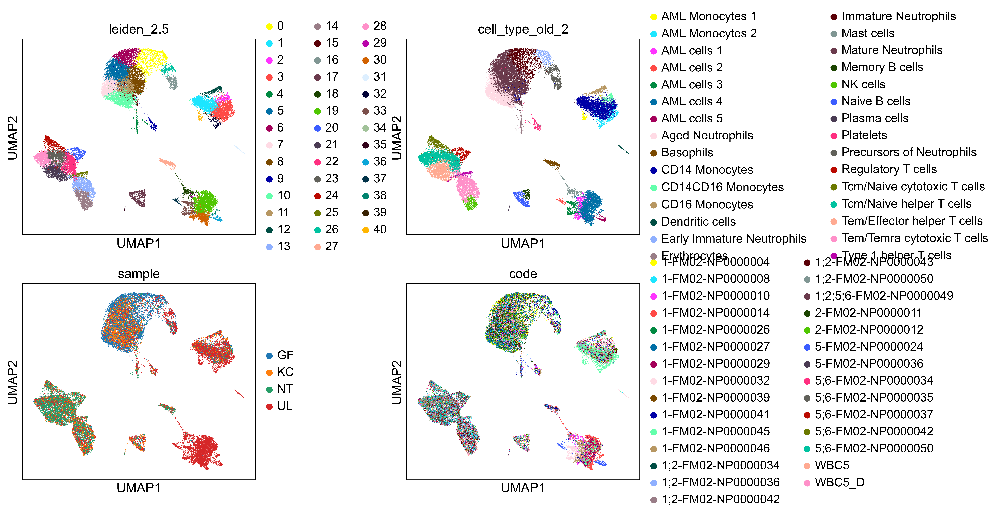

In [5]:
sc.tl.leiden(adata, flavor = "igraph", resolution = 2.5, key_added = "leiden_2.5")
sc.pl.umap(adata, color = ["leiden_2.5", "cell_type_old_2", "sample", "code"], 
           alpha = 1, 
           wspace = 0.5,
           ncols = 2,
           s = 1,
           save = "_leiden_2.5_clean_v2.png")

#n_iterations = 2

# Subclustering

In [6]:

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_2.5", ["17"]), 
             resolution = 0.2,
             key_added = "leiden_2.5_sub")

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_2.5_sub", ["14"]), 
             resolution = 0.2,
             key_added = "leiden_2.5_sub")


sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_2.5_sub", ["3"]), 
             resolution = 0.2,
             key_added = "leiden_2.5_sub")


sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_2.5_sub", ["0", "6", "8"]), 
             resolution = 0.6,
             key_added = "leiden_2.5_sub")

sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_2.5_sub", ["33"]), 
             resolution = 0.1,
             key_added = "leiden_2.5_sub")


sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_2.5_sub", ["30"]), 
             resolution = 0.2,
             key_added = "leiden_2.5_sub")


sc.tl.leiden(adata, 
             flavor = "igraph", 
             restrict_to=("leiden_2.5_sub", ["19"]), 
             resolution = 0.5,
             key_added = "leiden_2.5_sub")



running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)


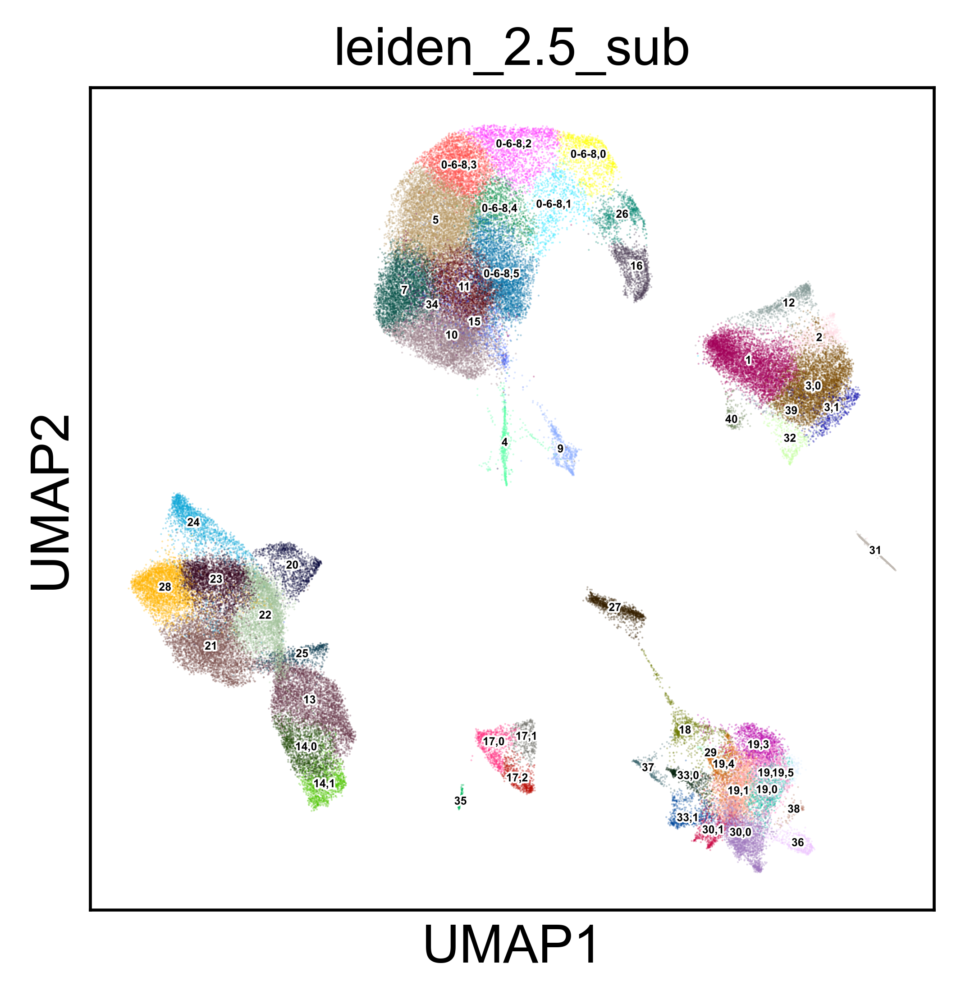

In [7]:
sc.pl.umap(adata, color = ["leiden_2.5_sub"], 
           alpha = 0.33, 
           wspace = 0.5,
           ncols = 3,
           s = 1, 
           legend_loc = "on data", legend_fontsize = 3, legend_fontoutline = True,
           save = "_leiden_2.5_sub_only_clean_v2.png")

In [10]:
# Saving obs dataframe

fname = 'backups/clustering_leiden_2.5_sub_round2_obs_%dx%d_%s'%(adata.obs.shape[0],adata.obs.shape[1],now())
print(fname)
save_df(adata.obs,fname)


backups/clustering_leiden_2.5_sub_round2_obs_86447x28_241024_08h44
